# Compare methods with optimize parameters in ref_case

In [1]:
import xarray as xr
import pandas as pd
import numpy as np

import hvplot.xarray
import hvplot.pandas

import matplotlib.pyplot as plt
from cycler import cycler

from sstats import signals as sg
from sstats import sigp as sigp
from sstats import tseries as ts
from sstats import get_cmap_colors

import hvplot.xarray
import hvplot.pandas
import holoviews as hv

import pynsitu as pyn
import lib as lib
from lib import KEYS, raw_dir, images_dir
import os
from glob import glob

import synthetic_traj as st

from synthetic_traj import synthetic_traj, noise_irregular_sampling, ref_case, typical_case

/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:55: UserWarning: ipyleaflet not available
  warnings.warn("ipyleaflet not available")
/Users/mdemol/opt/anaconda3/envs/mdenv/lib/python3.9/site-packages/pyTMD/tools.py:56: UserWarning: Some functions will throw an exception if called
  warnings.warn("Some functions will throw an exception if called")


___________
# Reference case + centered_diff

In [3]:
N=100
acc_cut = 1e-3
position_noise=20
ntype = 'white_noise'
offset_type = 'svp_scripps_10'
dt_smooth = '30min'
true_key = 'True_'+dt_smooth
spectral_diff = False
ref_case['spectral_diff'] = spectral_diff
print(ref_case)

{'T': 5, 'U_low': 0.3, 'U_ni': 0.2, 'U_2': 0, 'U_1': 0, 'tau_eta': 0.1, 'n_layers': 5, 'spectral_diff': False}


In [4]:
DF = dict()

# TRUE
t = (50, '1min') # use it instead of (50, 1/24/60 because otherwise not regularly sampled
dst = synthetic_traj(t, N , **ref_case)# u,v, ax, ay computed
dft = st.dataset2dataframe(dst).rename(columns={'draw':'id'})
DF['True_1min'] = dft

#OBSERVED
dso= noise_irregular_sampling(dst, t, position_noise, ntype=ntype, offset_type=offset_type, istart=6097)
dfo = st.dataset2dataframe(dso).rename(columns={'draw':'id'})
dfo = dfo.groupby('id').apply(pyn.geo.compute_dt, time='index')


DF['Observed'] = dfo

# Interpolated True
dsti = dst.sel(time = pd.date_range(dfo.index.min(), dfo.index.max(), freq=dt_smooth))
dsti['dt']=dsti.time.diff('time')/pd.Timedelta('1s')
st.add_position_noise(dsti, dsti.time, position_noise, ntype=ntype, inplace=True)#adding noise
dsti['u_noise'] = dsti.x_noise.differentiate('time', datetime_unit='s')
dsti['v_noise'] = dsti.y_noise.differentiate('time', datetime_unit='s')
dfti = st.dataset2dataframe(dsti).rename(columns={'draw':'id'})
dfti = dfti.groupby('id').apply(pyn.geo.compute_velocities,time='index', distance='xy', names=('u', 'v', 'U'), fill_startend=True, centered=True, keep_dt=True)
dfti = dfti.groupby('id').apply(pyn.geo.compute_accelerations,from_ =('xy', 'x', 'y'), names=('ax', 'ay', 'Axy'), keep_dt=True)
dfti = dfti.groupby('id').apply(pyn.geo.compute_accelerations,from_ =('xy', 'x_noise', 'y_noise'), names=('ax_noise', 'ay_noise', 'Axy_noise'), keep_dt=True)
dsti = dfti.reset_index().set_index(['time', 'id']).to_xarray()

DF['True_'+dt_smooth] = dfti

centred diff
centred diff
-13394.13809599266
6097


In [5]:
parameters_var = dict(acc_cut=1,
                         position_error=60,
                         acceleration_amplitude = 4e-6,
                         acceleration_T = 0.05*86400,
                         time_chunk=2,
                         acc_cut_key = ('ax', 'ay', 'Axy'))
parameters_lowess = dict(degree=2, iteration=3)
parameters_spydell = dict(nb_pt_mean=5, acc_cut=1)


dfl = pyn.drifters.smooth_all(dfo, 'lowess', dt_smooth, parameters = parameters_lowess, spectral_diff = spectral_diff, geo=False)
dfv = pyn.drifters.smooth_all(dfo, 'variational', dt_smooth, parameters = parameters_var, spectral_diff = spectral_diff, geo=False)
dfs = pyn.drifters.smooth_all(dfo, 'spydell', dt_smooth, parameters = parameters_spydell, spectral_diff = spectral_diff, geo=False)

DF['LOWESS'] = dfl
DF['Variational']=dfv
DF['Empirical']=dfs
color = {'True_1min':'grey','Observed':'gold','True_30min':'k', 'LOWESS':'teal', 'Variational':'salmon', 'Empirical':'r'}

0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0 single spikes dropped out of 0 potential ones (acceleration threshold)
Chunking dataframe into 2 days chunks
0

___________
# HVPLOT

In [20]:
label = {'x':'Zonal position x [m]', 'y':'Meridional position y [m]',
                 'u':r'Zonal velocity u [m/s-1]','v':r'Meridional velocity v [m/s-1]',
                 'ax':r'Zonal acceleration ax [m/s-2]', 'ay':r'Meridional acceleration ay [m/s-2]$'}
label_diff = {'x':r'Zonal position differences x-xt [m]', 'y':'Meridional position y-yt [m]',
                 'u':r'Zonal velocity differences u-ut [m/s-1]','v':r'Meridional velocity differences v-vt [m/s-1]',
                 'ax':r'Zonal acceleration differences ax-axt [m/s-2]', 'ay':r'Meridional acceleration differences ay-ayt [m/s-2]'}
def hvplot_DF(DF, d, var=None, label=label):
    if not var :
        var = ['x', 'y', 'u','v','ax', 'ay']
    Hv = []
    for v in var :
        init = 0
        for l in DF :
            df = DF[l]
            if init == 0:
                hvplot = df[df.id == d][v].hvplot(label = l, kind ='scatter', color=color[l], ylabel =label[v] )
                init = 1
            hvplot *= df[df.id == d][v].hvplot(label = l, kind ='scatter', color=color[l], ylabel =label[v])
        Hv.append(hvplot)
    print(len(Hv))
    layout = hv.Layout(Hv[0] + Hv[1] + Hv[2] + Hv[3] + Hv [4]+ Hv [5]).cols(2)
    return layout

In [12]:
d=0
DF0=DF.copy()
DF0.pop('True_1min')
hvplot_DF(DF0, d, ['x', 'y', 'u','v','ax', 'ay'])

6


:Layout
   .Overlay.I   :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (x)
      .Scatter.Observed.II :Scatter   [time]   (x)
      .Scatter.True_30min  :Scatter   [time]   (x)
      .Scatter.LOWESS      :Scatter   [time]   (x)
      .Scatter.Variational :Scatter   [time]   (x)
      .Scatter.Empirical   :Scatter   [time]   (x)
   .Overlay.II  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (y)
      .Scatter.Observed.II :Scatter   [time]   (y)
      .Scatter.True_30min  :Scatter   [time]   (y)
      .Scatter.LOWESS      :Scatter   [time]   (y)
      .Scatter.Variational :Scatter   [time]   (y)
      .Scatter.Empirical   :Scatter   [time]   (y)
   .Overlay.III :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (u)
      .Scatter.Observed.II :Scatter   [time]   (u)
      .Scatter.True_30min  :Scatter   [time]   (u)
      .Scatter.LOWESS      :Scatter   [time]   (u)
      .Scatter.Variational :Scatter   [time]   (u)
      .Scatter.Empirical   :Scatter   [time]   (u)
   .Overlay.IV  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (v)
      .Scatter.Observed.II :Scatter   [time]   (v)
      .Scatter.True_30min  :Scatter   [time]   (v)
      .Scatter.LOWESS      :Scatter   [time]   (v)
      .Scatter.Variational :Scatter   [time]   (v)
      .Scatter.Empirical   :Scatter   [time]   (v)
   .Overlay.V   :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (ax)
      .Scatter.Observed.II :Scatter   [time]   (ax)
      .Scatter.True_30min  :Scatter   [time]   (ax)
      .Scatter.LOWESS      :Scatter   [time]   (ax)
      .Scatter.Variational :Scatter   [time]   (ax)
      .Scatter.Empirical   :Scatter   [time]   (ax)
   .Overlay.VI  :Overlay
      .Scatter.Observed.I  :Scatter   [time]   (ay)
      .Scatter.Observed.II :Scatter   [time]   (ay)
      .Scatter.True_30min  :Scatter   [time]   (ay)
      .Scatter.LOWESS      :Scatter   [time]   (ay)
      .Scatter.Variational :Scatter   [time]   (ay)
      .Scatter.Empirical   :Scatter   [time]   (ay)

In [21]:
d=0
DF0=DF.copy()
DF0.pop('True_1min')
hvplot_DF(DF_diff, d, ['x', 'y', 'u','v','ax', 'ay'], label_diff)

6


:Layout
   .Overlay.I   :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (x)
      .Scatter.LOWESS.II   :Scatter   [time]   (x)
      .Scatter.Variational :Scatter   [time]   (x)
      .Scatter.Empirical   :Scatter   [time]   (x)
   .Overlay.II  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (y)
      .Scatter.LOWESS.II   :Scatter   [time]   (y)
      .Scatter.Variational :Scatter   [time]   (y)
      .Scatter.Empirical   :Scatter   [time]   (y)
   .Overlay.III :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (u)
      .Scatter.LOWESS.II   :Scatter   [time]   (u)
      .Scatter.Variational :Scatter   [time]   (u)
      .Scatter.Empirical   :Scatter   [time]   (u)
   .Overlay.IV  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (v)
      .Scatter.LOWESS.II   :Scatter   [time]   (v)
      .Scatter.Variational :Scatter   [time]   (v)
      .Scatter.Empirical   :Scatter   [time]   (v)
   .Overlay.V   :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (ax)
      .Scatter.LOWESS.II   :Scatter   [time]   (ax)
      .Scatter.Variational :Scatter   [time]   (ax)
      .Scatter.Empirical   :Scatter   [time]   (ax)
   .Overlay.VI  :Overlay
      .Scatter.LOWESS.I    :Scatter   [time]   (ay)
      .Scatter.LOWESS.II   :Scatter   [time]   (ay)
      .Scatter.Variational :Scatter   [time]   (ay)
      .Scatter.Empirical   :Scatter   [time]   (ay)

___________
# MS

In [2]:
def ms_diff(DF, true_key, var = ['x', 'y', 'u','v','ax', 'ay', 'X', 'U', 'Axy']):
    DF = DF.copy()
    dft = DF[true_key]
    dft_ = (dft.set_index('id')[var]).groupby('id').var()
    dfms  = pd.DataFrame(index = DF.keys(), columns = var)
    dfmsr = pd.DataFrame(index = DF.keys(), columns = var)
    for l in DF :
        df = DF[l]
        if np.all(df.index.values == dft.index.values):
            df_ = df.set_index('id')[var]-dft.set_index('id')[var]
            #dfr_ = (df.set_index('id')[var]-dft.set_index('id')[var])/dft.set_index('id')[var]
            dfms.loc[l] = df_.groupby('id').var().mean()
            dfmsr.loc[l] = (df_.groupby('id').var()/dft_).mean()
        else : 
            print(l + ' has not the same time index')
            continue
    dfms = pd.concat([dfms, dfmsr.rename(columns = {v : 'ratio_'+v for v in var})], axis=1).dropna()
    return dfms

In [81]:
dfms = ms_diff(DF, true_key='True_'+dt_smooth).astype(float)
dfr = dfms[[l for l in dfms.columns if 'ratio_' in l]]
dfr =dfr.rename(columns = {l:l.replace('ratio_','') for l in dfr.columns})*100

True_1min has not the same time index
Observed has not the same time index


In [82]:
dfr = dfr.iloc[1:]

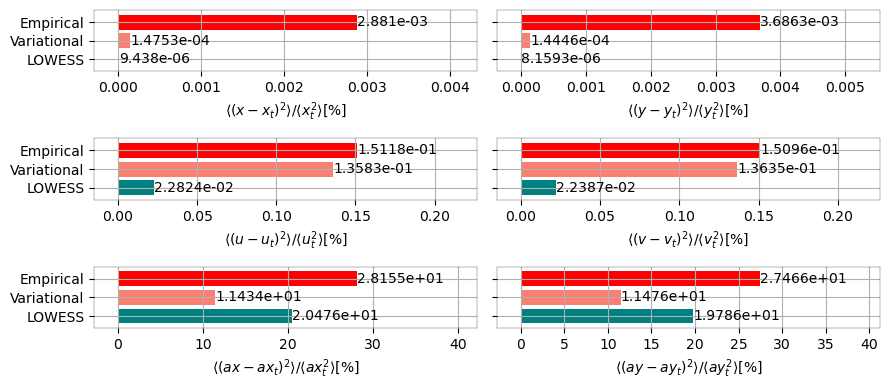

In [83]:
fig, axs = plt.subplots(3,2, sharey=True, figsize = (9,4))
i=0
axs = axs.flatten()
for var in ['x', 'y', 'u','v','ax','ay',] : 
    ax=axs[i]
    dfr[var].plot.barh(ax=ax, color =['teal', 'salmon', 'r'], width =0.8)
    ax.grid()
    ax.set_xlim(-0.1*dfr[var].max(), dfr[var].max()*1.5)
    i+=1
    ax.set_xlabel(fr'$\langle ({var}-{var}_t)^2 \rangle / \langle {var}_t^2 \rangle [\%]$')
    ax.bar_label(ax.containers[0], labels =[ np.format_float_scientific(l,precision = 4, exp_digits=2) for l in dfr[var].values])
fig.tight_layout()
#fig.suptitle('refcase =' +str(ref_case) + '\n spydell ' +str(parameters_spydell)+'\n variational '+str(parameters_var)+'\n lowess '+str(parameters_lowess),
#            x= 0.5, y=-0.02, fontsize=8)
path = os.path.join(images_dir, "comp_method_ref_case.png")
fig.savefig(path, dpi=250)

___________
# Spectra

In [6]:
linthresh =5e-1
linscale = 0.3
color = {'True_1min':'grey','Observed':'gold','True_30min':'k', 'LOWESS':'teal', 'Variational':'salmon', 'Empirical':'r'}
zorder = {'True_1min':0,'True_30min':0, 'LOWESS':1, 'Variational':1, 'Empirical':1}

In [7]:
def DSE2dse(DSE):
    ds = xr.concat([d[['x_y', 'u_v', 'ax_ay']]for d in DSE.values()], dim =list(DSE.keys()))
    return ds.rename({'concat_dim':'Trajectory'})

def find_fmin_fmax(ds, pourcentage):
    ds = ds.where(ds<pourcentage/100, drop=True)
    return float(ds.isel(frequency=0).frequency), float(ds.isel(frequency=-1).frequency)

DF0 = DF.copy()
DF0.pop('True_1min')
DSE = st.spectrum_DF(DF0,nperseg='20D', detrend = 'linear')
dse = DSE2dse(DSE)

#diff spectra
DF_diff = st.build_DF_diff(DF0, true_key='True_30min')
DSE_d = st.spectrum_DF(DF_diff)
dse_d = DSE2dse(DSE_d)

DSE_dn =DSE_d.copy()
for l in DSE_d :
    DSE_dn[l] = DSE_d[l]/DSE['True_30min']
    
Fu = {l:find_fmin_fmax(DSE_dn[l].u_v.mean('id'), 10) for l in DSE_dn}
Fa = {l:find_fmin_fmax(DSE_dn[l].ax_ay.mean('id'), 10) for l in DSE_dn}

True_30min
LOWESS
Variational
Empirical
Observed has not the same time index
LOWESS
Variational
Empirical


In [27]:
Fa

{'LOWESS': (-5.3500000000000005, 4.3500000000000005),
 'Variational': (-3.1, 1.9000000000000001),
 'Empirical': (-2.5, 1.25)}

In [28]:
Fu

{'LOWESS': (-6.0, 4.800000000000001),
 'Variational': (-3.1, 1.9000000000000001),
 'Empirical': (-2.6, 1.25)}

## Simple

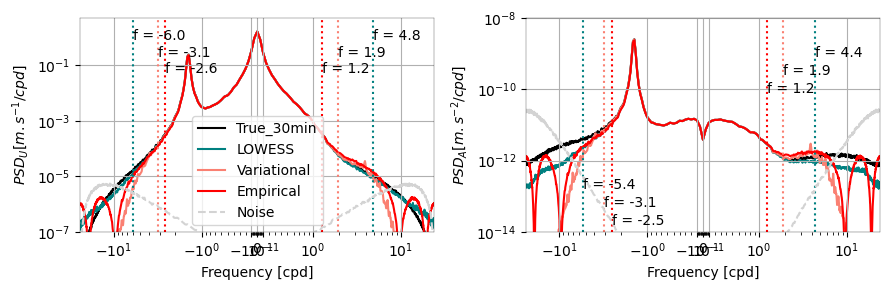

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(9,3))
ax=axs[0]
i=0
for l in DSE.keys():
    DSE[l].u_v.mean('id').plot( ax=ax, label=l, color=color[l], zorder=zorder[l],)
    if l!='True_30min':
        ax.axvline(Fu[l][0], color=color[l], ls=':')
        ax.axvline(Fu[l][1], color=color[l], ls=':')
        ax.annotate(f'f = {round(Fu[l][0], 1)}', (Fu[l][0], 8e-1/10**i))
        ax.annotate(f'f = {round(Fu[l][1], 1)}', (Fu[l][1] ,8e-1/10**i))
        i+=0.6
DSE['True_30min'].u_noise_v_noise.mean('id').plot( ax=ax, color='lightgrey', ls='--', label='Noise')

ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
ax.set_ylim(1e-7, 5e0)
ax.set_ylabel(r'$PSD_{U} [m.s^{-1}/cpd]$')
ax.set_xlabel('Frequency [cpd]')
ax.legend()
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))

ax=axs[1]
for l in DSE.keys():
    DSE[l].ax_ay.mean('id').plot( ax=ax, label=l, color=color[l], zorder=zorder[l],)
    if l!='True_30min':
        ax.axvline(Fa[l][0], color=color[l], ls=':')
        ax.axvline(Fa[l][1], color=color[l], ls=':')
        ax.annotate(f'f = {round(Fa[l][0], 1)}', (Fa[l][0], 1e-11/10**i))
        ax.annotate(f'f = {round(Fa[l][1], 1)}', (Fa[l][1] ,5e-8/10**i))
        i+=0.5
DSE['True_30min'].ax_noise_ay_noise.mean('id').plot( ax=ax, color='lightgrey', ls='--', label='Noise')
ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
ax.set_ylim(1e-14,1e-8)
ax.set_ylabel(r'$PSD_{A} [m.s^{-2}/cpd]$')
ax.set_xlabel('Frequency [cpd]')
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))
#ax.legend()
fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_spectra.png'), dpi =200, bbox_inches="tight")

## diff

In [9]:
dsend, dsepd = st.negpos_spectra(dse_d.mean('id'))
dsend_ = (dsend.cumulative_integrate('frequency'))/(dsend.integrate('frequency'))
dsepd_ = (dsepd.cumulative_integrate('frequency'))/(dsepd.integrate('frequency'))
dsend_['frequency']=-dsend_['frequency']
dsend_ = dsend_.sortby('frequency')
dsed_ = xr.combine_by_coords([dsend_, dsepd_])

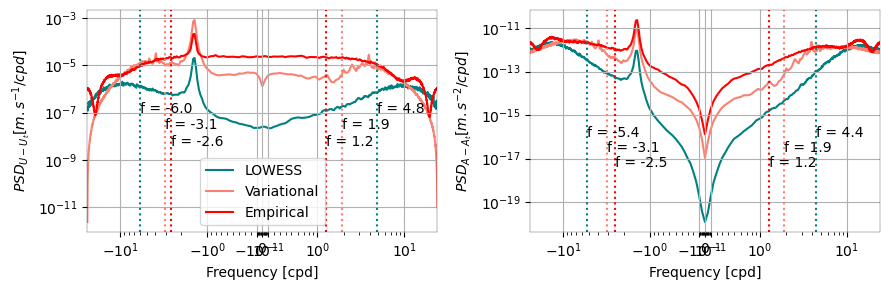

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(9,3))
ax=axs[0]
#DSE_d.pop('nb_pt_mean =9')
i=0
for l in DSE_d.keys():
    DSE_d[l].u_v.mean('id').plot( ax=ax,color=color[l], zorder=zorder[l], label=l)
    ax.axvline(Fu[l][0], color=color[l], ls=':')
    ax.axvline(Fu[l][1], color=color[l], ls=':')
    ax.annotate(f'f = {round(Fu[l][0], 1)}', (Fu[l][0], 1e-7/10**i))
    ax.annotate(f'f = {round(Fu[l][1], 1)}', (Fu[l][1] ,1e-7/10**i))
    i+=0.7
ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
#ax.set_ylim(1e-7, 5e0)
ax.set_ylabel(r'$PSD_{U-U_t} [m.s^{-1}/cpd]$')
ax.set_xlabel('Frequency [cpd]')
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))
ax.legend()

ax=axs[1]
i=0
for l in DSE_d.keys():
    DSE_d[l].ax_ay.mean('id').plot( ax=ax,color=color[l], zorder=zorder[l], label=l)
    ax.axvline(Fa[l][0], color=color[l], ls=':')
    ax.axvline(Fa[l][1], color=color[l], ls=':')
    ax.annotate(f'f = {round(Fa[l][0], 1)}', (Fa[l][0], 1e-16/10**i))
    ax.annotate(f'f = {round(Fa[l][1], 1)}', (Fa[l][1] ,1e-16/10**i))
    i+=0.7
ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
#ax.set_ylim(5e-13, 1e-5)
ax.set_ylabel(r'$PSD_{A-A_t} [m.s^{-2}/cpd]$')
ax.set_xlabel('Frequency [cpd]')
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))

fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_diffspectra.png'), dpi =200, bbox_inches="tight")

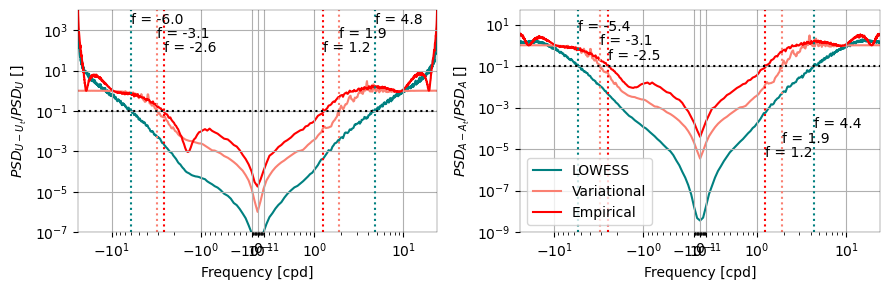

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(9,3))
ax=axs[0]
i=0
for l in DSE_dn.keys():
    DSE_dn[l].u_v.mean('id').plot( ax=ax,color=color[l], zorder=zorder[l], label=l)
    ax.axvline(Fu[l][0], color=color[l], ls=':')
    ax.axvline(Fu[l][1], color=color[l], ls=':')
    ax.annotate(f'f = {round(Fu[l][0], 1)}', (Fu[l][0], 2e3/10**i))
    ax.annotate(f'f = {round(Fu[l][1], 1)}', (Fu[l][1] ,2e3/10**i))
    i+=0.7

ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
ax.set_ylim(1e-7, 1e4)
ax.set_ylabel(r'$PSD_{U-U_t}/PSD_{U}$ []')
ax.set_xlabel('Frequency [cpd]')
ax.axhline(1e-1, ls=':', color='k')
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))

ax=axs[1]
i=0
for l in DSE_dn.keys():
    DSE_dn[l].ax_ay.mean('id').plot( ax=ax,color=color[l], zorder=zorder[l], label=l)
    ax.axvline(Fa[l][0], color=color[l], ls=':')
    ax.axvline(Fa[l][1], color=color[l], ls=':')
    ax.annotate(f'f = {round(Fa[l][0], 1)}', (Fa[l][0], 5e0/10**i))
    ax.annotate(f'f = {round(Fa[l][1], 1)}', (Fa[l][1] ,1e-4/10**i))
    i+=0.7
ax.grid()
ax.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
ax.set_yscale('log')
ax.set_xlim(-24*60/30/2,24*60/30/2)
ax.set_ylim(1e-9, 5e1)
ax.set_ylabel(r'$PSD_{A-A_t}/PSD_{A}$ []')
ax.set_xlabel('Frequency [cpd]')
ax.legend()
ax.axhline(1e-1, ls=':', color='k')
ax.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))

fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_diffspectra_normed.png'), dpi =200, bbox_inches="tight")

## $\int_0^f PSD_{\alpha-\alpha_t}/PSD_{\alpha}$

In [15]:
dse_d

<xarray.Dataset>
Dimensions:     (Trajectory: 3, id: 100, frequency: 960)
Coordinates:
  * id          (id) int64 0 1 2 3 4 5 6 7 8 9 ... 90 91 92 93 94 95 96 97 98 99
  * frequency   (frequency) float64 -24.0 -23.95 -23.9 ... 23.85 23.9 23.95
  * Trajectory  (Trajectory) object 'LOWESS' 'Variational' 'Empirical'
Data variables:
    x_y         (Trajectory, id, frequency) float64 0.5951 0.9624 ... 1.169
    u_v         (Trajectory, id, frequency) float64 2.255e-07 ... 7.727e-07
    ax_ay       (Trajectory, id, frequency) float64 9.07e-13 ... 1.781e-12

In [45]:
ds=(dse_d.cumulative_integrate('frequency')/(dse.sel(Trajectory='True_30min').integrate('frequency'))).mean('id')*100

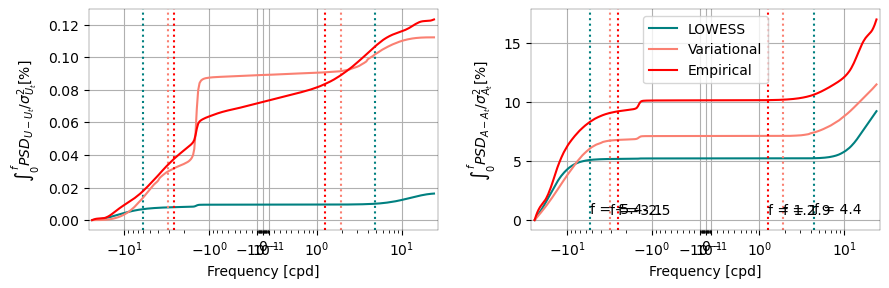

In [47]:
fig, axs = plt.subplots(1,2, figsize=(9,3))
i=0
for l in dse_.Trajectory.values :
    ds.sel(Trajectory=l).u_v.plot(ax=axs[0], color=color[l], label=l)
    axs[0].axvline(Fu[l][0], color=color[l], ls=':')
    axs[0].axvline(Fu[l][1], color=color[l], ls=':')
    axs[0].annotate(f'f = {round(Fu[l][0], 1)}', (Fu[l][0],0.95-i))
    axs[0].annotate(f'f = {round(Fu[l][1], 1)}', (Fu[l][1] ,0.95-i))
    axs[0].set_ylabel(r'$\int_0^{ f} PSD_{U-U_t}/\sigma^2_{U_t} [\%]$')
    ds.sel(Trajectory=l).ax_ay.plot(ax=axs[1], color=color[l], label=l)
    axs[1].axvline(Fa[l][0], color=color[l], ls=':')
    axs[1].axvline(Fa[l][1], color=color[l], ls=':')
    axs[1].annotate(f'f = {round(Fa[l][0], 1)}', (Fa[l][0],0.6-i))
    axs[1].annotate(f'f = {round(Fa[l][1], 1)}', (Fa[l][1] ,0.6-i))
    axs[1].set_ylabel(r'$\int_0^{f} PSD_{A-A_t}/\sigma^2_{A_t} [\%]$')
    axs[1].legend()
    i+=0.08
for a in axs :
    a.grid()
    a.set_title('')
    a.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
    a.set_xlabel('Frequency [cpd]')
    a.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))
    #a.axhline(0.9,color='k', ls='--')

fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_interror.png'), dpi =200, bbox_inches="tight")

In [76]:
dsen_ = (dsend.cumulative_integrate('frequency')/(dse.sel(Trajectory='True_30min').integrate('frequency'))).mean('id')*100
dsep_ = (dsepd.cumulative_integrate('frequency')/(dse.sel(Trajectory='True_30min').integrate('frequency'))).mean('id')*100
dsen_['frequency']=-dsen_['frequency']
dsen_ = dsen_.sortby('frequency')
dse_ = xr.combine_by_coords([dsen_, dsep_])

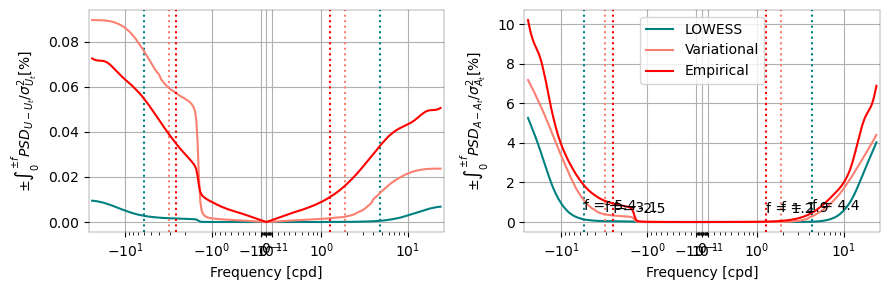

In [77]:
fig, axs = plt.subplots(1,2, figsize=(9,3))
i=0
for l in dse_.Trajectory.values :
    dse_.sel(Trajectory=l).u_v.plot(ax=axs[0], color=color[l], label=l)
    axs[0].axvline(Fu[l][0], color=color[l], ls=':')
    axs[0].axvline(Fu[l][1], color=color[l], ls=':')
    axs[0].annotate(f'f = {round(Fu[l][0], 1)}', (Fu[l][0],0.95-i))
    axs[0].annotate(f'f = {round(Fu[l][1], 1)}', (Fu[l][1] ,0.95-i))
    axs[0].set_ylabel(r'$\pm \int_0^{\pm f} PSD_{U-U_t}/\sigma^2_{U_t} [\%]$')
    dse_.sel(Trajectory=l).ax_ay.plot(ax=axs[1], color=color[l], label=l)
    axs[1].axvline(Fa[l][0], color=color[l], ls=':')
    axs[1].axvline(Fa[l][1], color=color[l], ls=':')
    axs[1].annotate(f'f = {round(Fa[l][0], 1)}', (Fa[l][0],0.6-i))
    axs[1].annotate(f'f = {round(Fa[l][1], 1)}', (Fa[l][1] ,0.6-i))
    axs[1].set_ylabel(r'$ \pm \int_0^{\pm f} PSD_{A-A_t}/\sigma^2_{A_t} [\%]$')
    axs[1].legend()
    i+=0.08
for a in axs :
    a.grid()
    a.set_title('')
    a.set_xscale('symlog',linthresh =linthresh, linscale =linscale)
    a.set_xlabel('Frequency [cpd]')
    a.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))
    #a.axhline(0.9,color='k', ls='--')

fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_interror.png'), dpi =200, bbox_inches="tight")

In [78]:
ds_ = sum(st.negpos_spectra(dse))
dsd = sum(st.negpos_spectra(dse_d))
ds__ = (dsd.cumulative_integrate('frequency')/ds_.sel(Trajectory='True_30min').integrate('frequency')).mean('id')*100

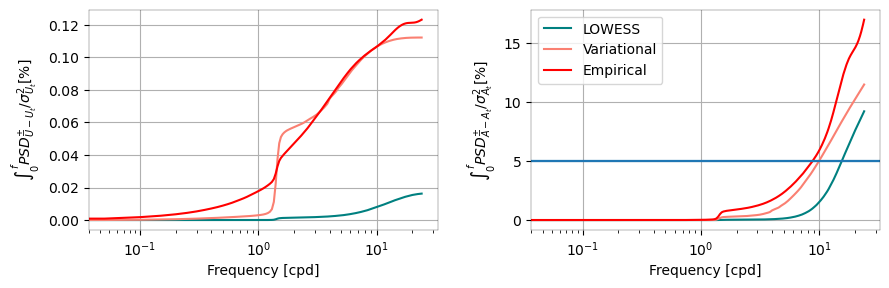

In [80]:
fig, axs = plt.subplots(1,2, figsize=(9,3))
i=0
for l in ds__.Trajectory.values :
    ds__.sel(Trajectory=l).u_v.plot(ax=axs[0], color=color[l], label=l)
    axs[0].set_ylabel(r'$\int_0^{f} PSD^{\pm}_{U-U_t}/\sigma^2_{U_t} [\%]$')
    ds__.sel(Trajectory=l).ax_ay.plot(ax=axs[1], color=color[l], label=l)
    axs[1].set_ylabel(r'$\int_0^{f} PSD^{\pm}_{A-A_t}/\sigma^2_{A_t} [\%]$')
    axs[1].axhline(5)
    axs[1].legend()
    i+=0.08
for a in axs :
    a.grid()
    a.set_title('')
    a.set_xscale('log')
    a.set_xlabel('Frequency [cpd]')
    a.xaxis.set_minor_locator(lib.MinorSymLogLocator(1e-1))
    #a.axhline(0.9,color='k', ls='--')

fig.tight_layout()
fig.savefig(os.path.join(images_dir, 'comp_opt_interror2.png'), dpi =200, bbox_inches="tight")

# Parseval

In [84]:
dfms

,x,y,u,v,ax,ay,X,U,Axy,ratio_x,ratio_y,ratio_u,ratio_v,ratio_ax,ratio_ay,ratio_X,ratio_U,ratio_Axy
True_30min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
LOWESS,2417.477248,2328.696652,0.000025,0.000025,5.357141e-11,5.181274e-11,3233.894577,0.000024,7.414338e-11,9.437995e-08,8.159314e-08,0.000228,0.000224,0.204764,0.197864,8.343896e-08,0.000461,0.718128
Variational,37904.859120,37971.003900,0.000149,0.000150,3.001490e-11,3.010990e-11,39101.723663,0.000172,2.678053e-11,1.475340e-06,1.444557e-06,0.001358,0.001363,0.114336,0.114762,1.072109e-06,0.003270,0.260258
Empirical,768140.837313,883557.190386,0.000166,0.000166,7.362937e-11,7.188306e-11,778446.480677,0.000163,8.880672e-11,2.880957e-05,3.686291e-05,0.001512,0.001510,0.281546,0.274662,2.127992e-05,0.003158,0.862807


In [99]:
dfms.x +dfms.y

True_30min     0.000000e+00
LOWESS         4.746174e+03
Variational    7.587586e+04
Empirical      1.651698e+06
dtype: float64

In [100]:
dfms.u + dfms.v

True_30min     0.000000
LOWESS         0.000050
Variational    0.000299
Empirical      0.000332
dtype: float64

In [101]:
dfms.ax + dfms.ay

True_30min     0.000000e+00
LOWESS         1.053841e-10
Variational    6.012480e-11
Empirical      1.455124e-10
dtype: float64

In [104]:
dse_d.integrate('frequency').mean('id')

<xarray.Dataset>
Dimensions:     (Trajectory: 3)
Coordinates:
  * Trajectory  (Trajectory) object 'LOWESS' 'Variational' 'Empirical'
Data variables:
    x_y         (Trajectory) float64 1.788e+03 9.406e+04 1.413e+06
    u_v         (Trajectory) float64 4.301e-05 0.0002994 0.0003256
    ax_ay       (Trajectory) float64 4.828e-11 6.017e-11 8.882e-11

In [115]:
((DF_diff['LOWESS'].groupby('id').x.var()+DF_diff['LOWESS'].groupby('id').y.var())/(DF['LOWESS'].groupby('id').x.var()+DF['LOWESS'].groupby('id').y.var())).mean()

6.650147397383335e-08

In [112]:
DF['LOWESS'].groupby('id').x.var()+DF['LOWESS'].groupby('id').y.var()

id
0     5.008500e+10
1     6.399477e+10
2     1.000951e+11
3     2.764391e+11
4     2.148346e+11
          ...     
95    1.138725e+11
96    2.377387e+10
97    4.985254e+10
98    4.658683e+10
99    8.625740e+10
Length: 100, dtype: float64